In [30]:
import pandas as pd
import utils

basic_info_df = pd.read_csv('generated/data/parkings_info.csv')
basic_info_df['lat_long'] = list(zip(basic_info_df['latitude'], basic_info_df['longitude']))

def init_data_for_search(start='2016-01-02', end='2017-01-02', graph_nodes_max_dis=0.5, take_week=2, plot_=None):
    result = []
    for target_park in basic_info_df.parking_name.values:
        print('searching ' + target_park)
        target_area, adj, target_map, nks, kns, conns = utils.build_graph(basic_info_df, target_park, graph_nodes_max_dis)
        print(nks)
        key = nks[target_park]
        node_f = utils.get_nodes_features(target_area)
        try:
            seqs_raw = utils.build_area_seqs(target_area, nks, start, end).take(range(96 * 7 * 1, 96 * 7 * take_week))
            seqs_normal = seqs_raw.fillna(0)
            seqs_normal = utils.max_min_scale(seqs_normal)
            result.append([conns, target_park, seqs_normal, adj, node_f, key])
            plot_(seqs_normal, target_park)
        except AssertionError as ae:
            print(ae)
            continue
    return result

In [31]:
import matplotlib.pyplot as plt

def plot_(seqs_normal, target_park):
    plt.rc('font', size=30)
    fig, ax = plt.subplots()
    fig.set_figheight(15)
    fig.set_figwidth(40)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=30)
    plt.legend(fontsize=30)
    seqs_normal.plot(ax=ax, linewidth=5, alpha=0.6)
    ax.xaxis.set_tick_params(rotation=30)
#     ax.set_xticks(seqs_normal['date'][::96])
#     ax.set_xticklabels(seqs_normal['date'][::96], rotation=45)
    # seqs_normal[key].plot(ax=ax, linewidth=3, alpha=0.8)
    # ax.legend(['Ground Truth'] + ['Generated'], fontsize=16)
    ax.set_ylabel('Occupied Parking Space Rate', fontsize=30)
    ax.set_xlabel('Date Time', fontsize=30)
    fig.savefig("generated/data/2/raw_" + target_park + "_area.png")
    plt.close()
    
init_data_for_search(plot_=plot_)

No handles with labels found to put in legend.


searching 万山珠宝工业园
{'万山珠宝工业园': 0, '化工大厦': 1, '合正星园': 2}
2016-06-14 02:00:00 2017-01-02
searching 万达丰大厦
{'万达丰大厦': 0, '东悦名轩': 1, '东方华都': 2, '东方大厦': 3, '东方颐园': 4, '东门天地大厦': 5, '中信星光明庭管理处': 6, '华隆园': 7, '同乐大厦': 8, '嘉年华名苑': 9, '物资大厦': 10, '缤纷时代家园': 11, '都心名苑': 12, '雅园宾馆': 13}
2016-07-24 02:45:00 2016-10-23 23:45:00


No handles with labels found to put in legend.


searching 世濠大厦
{'世濠大厦': 0, '东悦名轩': 1, '东门天地大厦': 2, '半岛大厦': 3, '嘉年华名苑': 4, '工人文化宫': 5, '新白马': 6, '银都大厦': 7, '鸿基大厦': 8}


No handles with labels found to put in legend.


2016-08-31 17:45:00 2016-10-28 07:45:00
searching 东悦名轩
{'万达丰大厦': 0, '世濠大厦': 1, '东悦名轩': 2, '东方大厦': 3, '东方颐园': 4, '东门天地大厦': 5, '中信星光明庭管理处': 6, '华隆园': 7, '嘉年华名苑': 8, '新白马': 9, '物资大厦': 10, '缤纷时代家园': 11, '都心名苑': 12}
2016-07-24 02:45:00 2016-10-23 23:45:00


No handles with labels found to put in legend.


searching 东方华都
{'万达丰大厦': 0, '东方华都': 1, '东方大厦': 2, '东方颐园': 3, '俊园大厦': 4, '华隆园': 5, '名都大厦': 6, '朝花大厦': 7, '深业大厦': 8, '缤纷时代家园': 9, '联兴大厦': 10, '都心名苑': 11, '鲲田商贸停车场': 12}
2016-09-01 06:45:00 2016-12-31 23:00:00


No handles with labels found to put in legend.


searching 东方大厦
{'万达丰大厦': 0, '东悦名轩': 1, '东方华都': 2, '东方大厦': 3, '东方颐园': 4, '东门天地大厦': 5, '中信星光明庭管理处': 6, '华隆园': 7, '同乐大厦': 8, '嘉年华名苑': 9, '物资大厦': 10, '缤纷时代家园': 11, '都心名苑': 12, '雅园宾馆': 13}
2016-07-24 02:45:00 2016-10-23 23:45:00


No handles with labels found to put in legend.


searching 东方颐园
{'万达丰大厦': 0, '东悦名轩': 1, '东方华都': 2, '东方大厦': 3, '东方颐园': 4, '丰园酒店': 5, '俊园大厦': 6, '华隆园': 7, '名都大厦': 8, '朝花大厦': 9, '深业大厦': 10, '湖臻大厦': 11, '缤纷时代家园': 12, '联兴大厦': 13, '都心名苑': 14, '鲲田商贸停车场': 15}
2016-09-01 06:45:00 2016-12-22 00:30:00


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 东晓综合市场
{'东晓综合市场': 0, '百仕达花园一期': 1, '百仕达花园二期': 2, '鸿园居': 3}
2016-07-24 08:30:00 2016-08-10 10:00:00


No handles with labels found to put in legend.


searching 东翠花园
{'东翠花园': 0, '武警生活区银龙花园': 1}
2016-08-01 00:30:00 2017-01-02
searching 东门天地大厦
{'万达丰大厦': 0, '世濠大厦': 1, '东悦名轩': 2, '东方大厦': 3, '东门天地大厦': 4, '丰园酒店': 5, '嘉年华名苑': 6, '新白马': 7, '缤纷时代家园': 8, '都心名苑': 9, '鸿基大厦': 10}
2016-08-31 17:45:00 2016-10-28 07:45:00


No handles with labels found to put in legend.


searching 中信星光明庭管理处
{'万达丰大厦': 0, '东悦名轩': 1, '东方大厦': 2, '中信星光明庭管理处': 3, '同乐大厦': 4, '文锦广场': 5, '永通大厦': 6, '物资大厦': 7, '雅园宾馆': 8}
2016-06-30 19:15:00 2016-10-23 23:45:00


No handles with labels found to put in legend.


searching 中深石化大厦
{'中深石化大厦': 0, '翠景山庄': 1}
2016-05-31 19:30:00 2016-10-04 23:00:00


No handles with labels found to put in legend.


searching 中航凯特公寓
{'中航凯特公寓': 0, '华通大厦': 1, '国都花园': 2, '大信大厦': 3, '天元大厦': 4, '洪涛大厦': 5, '百汇大厦': 6, '红桂大厦': 7, '蔡屋围发展大厦': 8, '金园花园': 9, '长虹大厦': 10}
2016-07-24 03:30:00 2016-11-09 08:00:00


No handles with labels found to put in legend.


searching 丰园酒店
{'东方颐园': 0, '东门天地大厦': 1, '丰园酒店': 2, '嘉年华名苑': 3, '新白马': 4, '湖臻大厦': 5, '缤纷时代家园': 6, '都心名苑': 7, '银都大厦': 8, '鸿基大厦': 9}


No handles with labels found to put in legend.


2016-08-31 17:45:00 2016-10-28 07:45:00
searching 丽晶大厦
{'丽晶大厦': 0, '华润万象城': 1, '华瑞大厦': 2, '都市名园': 3, '金丰城': 4, '金山大厦': 5, '金融中心': 6}
2016-07-01 08:45:00 2016-12-31 23:45:00


No handles with labels found to put in legend.


searching 俊园大厦
{'东方华都': 0, '东方颐园': 1, '俊园大厦': 2, '华隆园': 3, '名都大厦': 4, '朝花大厦': 5, '深业大厦': 6, '联兴大厦': 7, '鲲田商贸停车场': 8}


No handles with labels found to put in legend.


2016-09-01 06:45:00 2017-01-02


No handles with labels found to put in legend.


searching 信托大厦
{'信托大厦': 0, '荔景大厦': 1}
2016-08-31 17:45:00 2017-01-02
searching 公路局大院
{'公路局大院': 0, '华丽园大厦': 1, '国家珠宝检测中心': 2, '柏丽花园': 3, '翠拥华庭': 4}
2016-08-22 15:30:00 2016-11-10 10:00:00


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 化工大厦
{'万山珠宝工业园': 0, '化工大厦': 1, '百仕达花园一期': 2}
2016-06-01 03:00:00 2016-08-10 10:00:00
searching 半岛大厦
{'世濠大厦': 0, '半岛大厦': 1, '合作金融大厦': 2, '工人文化宫': 3, '新白马': 4, '桂花大厦': 5, '永新商业城': 6, '电影大厦': 7, '红围坊停车场': 8, '银都大厦': 9, '鸿基大厦': 10}


No handles with labels found to put in legend.


2016-08-31 17:45:00 2016-11-30 23:45:00
searching 华丽园大厦
{'公路局大院': 0, '华丽园大厦': 1, '国家珠宝检测中心': 2, '孙逸仙心血管医院停车场': 3, '文锦广场': 4, '柏丽花园': 5, '翠拥华庭': 6}
2016-08-22 15:30:00 2016-11-10 10:00:00


No handles with labels found to put in legend.


searching 华安国际大酒店
{'华安国际大酒店': 0, '华润万象城': 1, '国都花园': 2, '宝丽大厦': 3, '振业大厦': 4, '桂花大厦': 5, '电影大厦': 6, '红围坊停车场': 7, '都市名园': 8, '金丰城': 9, '金山大厦': 10}
2016-07-27 00:00:00 2017-01-02


No handles with labels found to put in legend.


searching 华润万象城
{'丽晶大厦': 0, '华安国际大酒店': 1, '华润万象城': 2, '华瑞大厦': 3, '都市名园': 4, '金丰城': 5, '金山大厦': 6, '金融中心': 7}
2016-07-01 08:45:00 2016-12-31 23:45:00


No handles with labels found to put in legend.


searching 华瑞大厦
{'丽晶大厦': 0, '华润万象城': 1, '华瑞大厦': 2, '都市名园': 3, '金融中心': 4}
2016-07-01 08:45:00 2016-12-31 23:45:00


No handles with labels found to put in legend.


searching 华通大厦
{'中航凯特公寓': 0, '华通大厦': 1, '桂龙家园': 2, '洪涛大厦': 3, '百汇大厦': 4, '蔡屋围发展大厦': 5, '金园花园': 6, '长虹大厦': 7}
2016-07-24 03:30:00 2016-11-09 08:00:00


No handles with labels found to put in legend.


searching 华隆园
{'万达丰大厦': 0, '东悦名轩': 1, '东方华都': 2, '东方大厦': 3, '东方颐园': 4, '俊园大厦': 5, '华隆园': 6, '名都大厦': 7, '深业大厦': 8, '缤纷时代家园': 9, '联兴大厦': 10, '都心名苑': 11, '雅园宾馆': 12}
2016-08-31 20:00:00 2016-12-22 00:30:00


No handles with labels found to put in legend.


searching 合作金融大厦
{'半岛大厦': 0, '合作金融大厦': 1, '工人文化宫': 2, '永新商业城': 3, '电影大厦': 4, '银都大厦': 5, '鸿基大厦': 6}
2016-08-31 17:45:00

No handles with labels found to put in legend.


 2017-01-02
searching 合正星园
{'万山珠宝工业园': 0, '合正星园': 1, '宝琳珠宝交易中心': 2, '柏丽花园': 3, '湖景大厦': 4}
2016-07-24 22:30:00 2017-01-02


No handles with labels found to put in legend.


searching 同乐大厦
{'万达丰大厦': 0, '东方大厦': 1, '中信星光明庭管理处': 2, '同乐大厦': 3, '孙逸仙心血管医院停车场': 4, '文锦广场': 5, '永通大厦': 6, '物资大厦': 7, '雅园宾馆': 8}


No handles with labels found to put in legend.


2016-07-31 18:15:00 2016-10-23 23:45:00
searching 名都大厦
{'东方华都': 0, '东方颐园': 1, '俊园大厦': 2, '华隆园': 3, '名都大厦': 4, '朝花大厦': 5, '深业大厦': 6, '缤纷时代家园': 7, '联兴大厦': 8, '都心名苑': 9, '鲲田商贸停车场': 10}
2016-09-01 06:45:00 2016-12-31 23:45:00


No handles with labels found to put in legend.


searching 嘉年华名苑
{'万达丰大厦': 0, '世濠大厦': 1, '东悦名轩': 2, '东方大厦': 3, '东门天地大厦': 4, '丰园酒店': 5, '嘉年华名苑': 6, '新白马': 7, '缤纷时代家园': 8, '都心名苑': 9}


No handles with labels found to put in legend.


2016-07-23 12:00:00 2016-10-28 07:45:00
searching 国家珠宝检测中心
{'公路局大院': 0, '华丽园大厦': 1, '国家珠宝检测中心': 2, '孙逸仙心血管医院停车场': 3, '文锦广场': 4, '柏丽花园': 5, '翠拥华庭': 6, '翡翠公寓': 7}


No handles with labels found to put in legend.


2016-08-22 15:30:00 2016-11-10 10:00:00
searching 国都花园
{'中航凯特公寓': 0, '华安国际大酒店': 1, '国都花园': 2, '大信大厦': 3, '天元大厦': 4, '宝丽大厦': 5, '振业大厦': 6, '桂花大厦': 7, '电影大厦': 8, '红围坊停车场': 9, '红桂大厦': 10}
2016-07-27 00:00:00 2016-12-22 23:00:00


No handles with labels found to put in legend.


searching 大信大厦
{'中航凯特公寓': 0, '国都花园': 1, '大信大厦': 2, '天元大厦': 3, '宝丽大厦': 4, '桂花大厦': 5, '红桂大厦': 6}
2016-07-27 00:00:00 2016-12-22 23:00:00


No handles with labels found to put in legend.


searching 天元大厦
{'中航凯特公寓': 0, '国都花园': 1, '大信大厦': 2, '天元大厦': 3, '宝丽大厦': 4, '桂花大厦': 5, '桂龙家园': 6, '红桂大厦': 7, '金园花园': 8}


No handles with labels found to put in legend.


2016-07-27 00:00:00 2016-11-09 08:00:00
searching 孙逸仙心血管医院停车场
{'华丽园大厦': 0, '同乐大厦': 1, '国家珠宝检测中心': 2, '孙逸仙心血管医院停车场': 3, '文锦广场': 4, '雅园宾馆': 5}
2016-07-31 18:15:00 2016-12-31 22:45:00


No handles with labels found to put in legend.


searching 宝丽大厦
{'华安国际大酒店': 0, '国都花园': 1, '大信大厦': 2, '天元大厦': 3, '宝丽大厦': 4, '振业大厦': 5, '桂花大厦': 6, '电影大厦': 7, '红围坊停车场': 8, '红桂大厦': 9}
2016-07-27 00:00:00 2016-12-22 23:00:00


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 宝琳珠宝交易中心
{'合正星园': 0, '宝琳珠宝交易中心': 1, '湖景大厦': 2}
2016-06-30 19:30:00 2017-01-02
searching 工人文化宫
{'世濠大厦': 0, '半岛大厦': 1, '合作金融大厦': 2, '工人文化宫': 3, '新白马': 4, '桂花大厦': 5, '永新商业城': 6, '电影大厦': 7, '红围坊停车场': 8}


No handles with labels found to put in legend.


2016-08-31 16:30:00 2016-11-30 23:45:00
searching 建设集团大院
{'建设集团大院': 0, '洪涛大厦': 1, '百汇大厦': 2, '蔡屋围发展大厦': 3, '金园花园': 4, '长虹大厦': 5}
2016-07-24 03:30:00 2016-11-09 08:00:00


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 惠名花园
{'惠名花园': 0}
2016-05-31 19:15:00 2017-01-02
searching 振业大厦
{'华安国际大酒店': 0, '国都花园': 1, '宝丽大厦': 2, '振业大厦': 3, '桂花大厦': 4, '电影大厦': 5, '红围坊停车场': 6, '金丰城': 7, '金山大厦': 8}
2016-07-27 00:00:00 2017-01-02


No handles with labels found to put in legend.


searching 文锦广场
{'中信星光明庭管理处': 0, '华丽园大厦': 1, '同乐大厦': 2, '国家珠宝检测中心': 3, '孙逸仙心血管医院停车场': 4, '文锦广场': 5, '柏丽花园': 6, '翡翠公寓': 7, '雅园宾馆': 8}


No handles with labels found to put in legend.


2016-07-31 18:15:00 2016-10-23 23:45:00
searching 新白马
{'世濠大厦': 0, '东悦名轩': 1, '东门天地大厦': 2, '丰园酒店': 3, '半岛大厦': 4, '嘉年华名苑': 5, '工人文化宫': 6, '新白马': 7, '永新商业城': 8, '银都大厦': 9, '鸿基大厦': 10}


No handles with labels found to put in legend.


2016-08-31 17:45:00 2016-10-28 07:45:00
searching 朝花大厦
{'东方华都': 0, '东方颐园': 1, '俊园大厦': 2, '名都大厦': 3, '朝花大厦': 4, '深业大厦': 5, '联兴大厦': 6, '都心名苑': 7, '鲲田商贸停车场': 8}
2016-09-01 06:45:00 2017-01-02


No handles with labels found to put in legend.


searching 柏丽花园
{'公路局大院': 0, '华丽园大厦': 1, '合正星园': 2, '国家珠宝检测中心': 3, '文锦广场': 4, '柏丽花园': 5, '湖景大厦': 6, '翠拥华庭': 7, '翡翠公寓': 8}


No handles with labels found to put in legend.


2016-08-22 15:30:00 2016-11-10 10:00:00
searching 桂花大厦
{'半岛大厦': 0, '华安国际大酒店': 1, '国都花园': 2, '大信大厦': 3, '天元大厦': 4, '宝丽大厦': 5, '工人文化宫': 6, '振业大厦': 7, '桂花大厦': 8, '电影大厦': 9, '红围坊停车场': 10}
2016-07-27 00:00:00 2016-12-22 23:00:00


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 桂龙家园
{'华通大厦': 0, '天元大厦': 1, '桂龙家园': 2, '金园花园': 3}
2016-06-30 20:00:00 2016-11-09 08:00:00


No handles with labels found to put in legend.


searching 武警生活区银龙花园
{'东翠花园': 0, '武警生活区银龙花园': 1}
2016-08-01 00:30:00 2017-01-02
searching 永新商业城
{'半岛大厦': 0, '合作金融大厦': 1, '工人文化宫': 2, '新白马': 3, '永新商业城': 4, '电影大厦': 5, '红围坊停车场': 6, '银都大厦': 7, '鸿基大厦': 8}


No handles with labels found to put in legend.


2016-08-31 17:45:00 2016-11-30 23:45:00
searching 永通大厦
{'中信星光明庭管理处': 0, '同乐大厦': 1, '永通大厦': 2, '物资大厦': 3}
2016-06-30 19:15:00 2016-10-23 23:45:00


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 沁芳名苑
{'沁芳名苑': 0}
2016-07-17 01:15:00 2017-01-02
searching 洪涛大厦
{'中航凯特公寓': 0, '华通大厦': 1, '建设集团大院': 2, '洪涛大厦': 3, '百汇大厦': 4, '蔡屋围发展大厦': 5, '金园花园': 6, '长虹大厦': 7}
2016-07-24 03:30:00 2016-11-09 08:00:00


No handles with labels found to put in legend.


searching 深业大厦
{'东方华都': 0, '东方颐园': 1, '俊园大厦': 2, '华隆园': 3, '名都大厦': 4, '朝花大厦': 5, '深业大厦': 6, '联兴大厦': 7, '都心名苑': 8, '鲲田商贸停车场': 9}


No handles with labels found to put in legend.


2016-09-01 06:45:00 2017-01-02
searching 湖景大厦
{'合正星园': 0, '宝琳珠宝交易中心': 1, '柏丽花园': 2, '湖景大厦': 3, '翡翠公寓': 4}
2016-07-24 22:30:00 2017-01-02


No handles with labels found to put in legend.


searching 湖臻大厦
{'东方颐园': 0, '丰园酒店': 1, '湖臻大厦': 2, '都心名苑': 3, '银都大厦': 4, '鸿基大厦': 5}
2016-08-31 17:45:00 2016-12-31 22:45:00


No handles with labels found to put in legend.


searching 物资大厦
{'万达丰大厦': 0, '东悦名轩': 1, '东方大厦': 2, '中信星光明庭管理处': 3, '同乐大厦': 4, '永通大厦': 5, '物资大厦': 6}
2016-06-30 19:15:00 2016-10-23 23:45:00


No handles with labels found to put in legend.


searching 电影大厦
{'半岛大厦': 0, '华安国际大酒店': 1, '合作金融大厦': 2, '国都花园': 3, '宝丽大厦': 4, '工人文化宫': 5, '振业大厦': 6, '桂花大厦': 7, '永新商业城': 8, '电影大厦': 9, '红围坊停车场': 10}
2016-08-31 16:30:00 2017-01-02


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 百仕达花园一期
{'东晓综合市场': 0, '化工大厦': 1, '百仕达花园一期': 2, '百仕达花园二期': 3}
2016-05-31 19:45:00 2016-08-10 10:00:00


No handles with labels found to put in legend.


searching 百仕达花园二期
{'东晓综合市场': 0, '百仕达花园一期': 1, '百仕达花园二期': 2, '鸿园居': 3}
2016-07-24 08:30:00 2016-08-10 10:00:00
searching 百汇大厦
{'中航凯特公寓': 0, '华通大厦': 1, '建设集团大院': 2, '洪涛大厦': 3, '百汇大厦': 4, '蔡屋围发展大厦': 5, '金园花园': 6, '长虹大厦': 7}
2016-07-24 03:30:00 2016-11-09 08:00:00


No handles with labels found to put in legend.


searching 红围坊停车场
{'半岛大厦': 0, '华安国际大酒店': 1, '国都花园': 2, '宝丽大厦': 3, '工人文化宫': 4, '振业大厦': 5, '桂花大厦': 6, '永新商业城': 7, '电影大厦': 8, '红围坊停车场': 9}
2016-08-31 16:30:00 2017-01-02


No handles with labels found to put in legend.


searching 红桂大厦
{'中航凯特公寓': 0, '国都花园': 1, '大信大厦': 2, '天元大厦': 3, '宝丽大厦': 4, '红桂大厦': 5, '蔡屋围发展大厦': 6, '金园花园': 7}
2016-07-27 00:00:00 2016-11-09 08:00:00


No handles with labels found to put in legend.


searching 缤纷时代家园
{'万达丰大厦': 0, '东悦名轩': 1, '东方华都': 2, '东方大厦': 3, '东方颐园': 4, '东门天地大厦': 5, '丰园酒店': 6, '华隆园': 7, '名都大厦': 8, '嘉年华名苑': 9, '缤纷时代家园': 10, '都心名苑': 11, '雅园宾馆': 12}
2016-07-24 02:45:00 2016-10-28 07:45:00


No handles with labels found to put in legend.


searching 翠拥华庭
{'公路局大院': 0, '华丽园大厦': 1, '国家珠宝检测中心': 2, '柏丽花园': 3, '翠拥华庭': 4}
2016-08-22 15:30:00 2016-11-10 10:00:00


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 翠景山庄
{'中深石化大厦': 0, '翠景山庄': 1}
2016-05-31 19:30:00 2016-10-04 23:00:00
searching 翡翠公寓
{'国家珠宝检测中心': 0, '文锦广场': 1, '柏丽花园': 2, '湖景大厦': 3, '翡翠公寓': 4}
2016-07-24 22:30:00 2016-12-31 23:30:00


No handles with labels found to put in legend.


searching 联兴大厦
{'东方华都': 0, '东方颐园': 1, '俊园大厦': 2, '华隆园': 3, '名都大厦': 4, '朝花大厦': 5, '深业大厦': 6, '联兴大厦': 7, '都心名苑': 8, '鲲田商贸停车场': 9}
2016-09-01 06:45:00 2017-01-02


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 荔景大厦
{'信托大厦': 0, '荔景大厦': 1}
2016-08-31 17:45:00 2017-01-02
searching 蔡屋围发展大厦
{'中航凯特公寓': 0, '华通大厦': 1, '建设集团大院': 2, '洪涛大厦': 3, '百汇大厦': 4, '红桂大厦': 5, '蔡屋围发展大厦': 6, '金园花园': 7, '长虹大厦': 8}


No handles with labels found to put in legend.


2016-07-24 03:30:00 2016-11-09 08:00:00
searching 都市名园
{'丽晶大厦': 0, '华安国际大酒店': 1, '华润万象城': 2, '华瑞大厦': 3, '都市名园': 4, '金丰城': 5, '金山大厦': 6, '金融中心': 7}
2016-07-01 08:45:00 2016-12-31 23:45:00


No handles with labels found to put in legend.


searching 都心名苑
{'万达丰大厦': 0, '东悦名轩': 1, '东方华都': 2, '东方大厦': 3, '东方颐园': 4, '东门天地大厦': 5, '丰园酒店': 6, '华隆园': 7, '名都大厦': 8, '嘉年华名苑': 9, '朝花大厦': 10, '深业大厦': 11, '湖臻大厦': 12, '缤纷时代家园': 13, '联兴大厦': 14, '都心名苑': 15, '鲲田商贸停车场': 16}
2016-09-01 06:45:00 2016-10-28 07:45:00


No handles with labels found to put in legend.


searching 金丰城
{'丽晶大厦': 0, '华安国际大酒店': 1, '华润万象城': 2, '振业大厦': 3, '都市名园': 4, '金丰城': 5, '金山大厦': 6, '金融中心': 7}
2016-07-01 08:45:00 2017-01-02


No handles with labels found to put in legend.


searching 金园花园
{'中航凯特公寓': 0, '华通大厦': 1, '天元大厦': 2, '建设集团大院': 3, '桂龙家园': 4, '洪涛大厦': 5, '百汇大厦': 6, '红桂大厦': 7, '蔡屋围发展大厦': 8, '金园花园': 9, '长虹大厦': 10}


No handles with labels found to put in legend.


2016-07-24 03:30:00 2016-11-09 08:00:00
searching 金山大厦
{'丽晶大厦': 0, '华安国际大酒店': 1, '华润万象城': 2, '振业大厦': 3, '都市名园': 4, '金丰城': 5, '金山大厦': 6, '金融中心': 7}
2016-07-01 08:45:00 2017-01-02


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 金湖文化中心
{'金湖文化中心': 0, '金碧苑': 1}
2016-08-31 17:15:00 2017-01-02


No handles with labels found to put in legend.


searching 金碧苑
{'金湖文化中心': 0, '金碧苑': 1}
2016-08-31 17:15:00 2017-01-02
searching 金融中心
{'丽晶大厦': 0, '华润万象城': 1, '华瑞大厦': 2, '都市名园': 3, '金丰城': 4, '金山大厦': 5, '金融中心': 6}
2016-07-01 08:45:00 2016-12-31 23:45:00


No handles with labels found to put in legend.


searching 银都大厦
{'世濠大厦': 0, '丰园酒店': 1, '半岛大厦': 2, '合作金融大厦': 3, '新白马': 4, '永新商业城': 5, '湖臻大厦': 6, '银都大厦': 7, '鸿基大厦': 8}


No handles with labels found to put in legend.


2016-08-31 17:45:00 2016-11-30 23:45:00
searching 长虹大厦
{'中航凯特公寓': 0, '华通大厦': 1, '建设集团大院': 2, '洪涛大厦': 3, '百汇大厦': 4, '蔡屋围发展大厦': 5, '金园花园': 6, '长虹大厦': 7}
2016-07-24 03:30:00 2016-11-09 08:00:00


No handles with labels found to put in legend.


searching 雅园宾馆
{'万达丰大厦': 0, '东方大厦': 1, '中信星光明庭管理处': 2, '华隆园': 3, '同乐大厦': 4, '孙逸仙心血管医院停车场': 5, '文锦广场': 6, '缤纷时代家园': 7, '雅园宾馆': 8}


No handles with labels found to put in legend.


2016-07-31 18:15:00 2016-10-23 23:45:00
searching 鲲田商贸停车场
{'东方华都': 0, '东方颐园': 1, '俊园大厦': 2, '名都大厦': 3, '朝花大厦': 4, '深业大厦': 5, '联兴大厦': 6, '都心名苑': 7, '鲲田商贸停车场': 8}
2016-09-01 06:45:00 2017-01-02


No handles with labels found to put in legend.


searching 鸿园居
{'东晓综合市场': 0, '百仕达花园二期': 1, '鸿园居': 2}
2016-07-24 08:30:00 2016-12-31 23:45:00


No handles with labels found to put in legend.


searching 鸿基大厦
{'世濠大厦': 0, '东门天地大厦': 1, '丰园酒店': 2, '半岛大厦': 3, '合作金融大厦': 4, '新白马': 5, '永新商业城': 6, '湖臻大厦': 7, '银都大厦': 8, '鸿基大厦': 9}


No handles with labels found to put in legend.


2016-08-31 17:45:00 2016-11-30 23:45:00


No handles with labels found to put in legend.


searching 鸿景翠峰花园
{'鸿景翠峰花园': 0}
2016-05-23 16:30:00 2017-01-02


No handles with labels found to put in legend.


searching 鸿翠苑
{'鸿翠苑': 0}
2016-05-25 23:30:00 2017-01-02


No handles with labels found to put in legend.


searching 鹏兴花园
{'鹏兴花园': 0, '鹏兴花园二期': 1}
2016-06-30 19:30:00 2016-09-30 08:15:00


No handles with labels found to put in legend.


searching 鹏兴花园三期
{'鹏兴花园三期': 0, '鹏兴花园二期': 1, '鹏兴花园六期': 2}
2016-08-31 21:15:00 2017-01-02
searching 鹏兴花园二期
{'鹏兴花园': 0, '鹏兴花园三期': 1, '鹏兴花园二期': 2, '鹏兴花园六期': 3}
2016-08-31 21:15:00 2016-09-30 08:15:00


No handles with labels found to put in legend.
No handles with labels found to put in legend.


searching 鹏兴花园六期
{'鹏兴花园三期': 0, '鹏兴花园二期': 1, '鹏兴花园六期': 2}
2016-08-31 21:15:00 2017-01-02


No handles with labels found to put in legend.


searching 鹤围村
{'鹤围村': 0, '龙园山庄': 1}
2016-06-30 19:30:00 2016-10-23 23:45:00


No handles with labels found to put in legend.


searching 龙园山庄
{'鹤围村': 0, '龙园山庄': 1}
2016-06-30 19:30:00 2016-10-23 23:45:00


[[[['万山珠宝工业园', '化工大厦', 0.14910621163613547],
   ['万山珠宝工业园', '合正星园', 0.3571030803668528],
   ['化工大厦', '万山珠宝工业园', 0.14910621163613547],
   ['化工大厦', '合正星园', 0.5055523067914811],
   ['合正星园', '万山珠宝工业园', 0.3571030803668528],
   ['合正星园', '化工大厦', 0.5055523067914811]],
  '万山珠宝工业园',
  parking                     0         1         2
  date                                             
  2016-06-21 02:00:00  0.000000  0.771654  0.000000
  2016-06-21 02:15:00  0.000000  0.771654  0.004065
  2016-06-21 02:30:00  0.000000  0.779528  0.004065
  2016-06-21 02:45:00  0.000000  0.771654  0.004065
  2016-06-21 03:00:00  0.000000  0.803150  0.004065
  ...                       ...       ...       ...
  2016-06-28 00:45:00  0.098522  0.779528  0.995935
  2016-06-28 01:00:00  0.103448  0.787402  0.995935
  2016-06-28 01:15:00  0.103448  0.811024  1.000000
  2016-06-28 01:30:00  0.098522  0.803150  1.000000
  2016-06-28 01:45:00  0.103448  0.818898  1.000000
  
  [672 rows x 3 columns],
  matrix([[0.        

INFO:tensorflow:Using local port 21128
INFO:tensorflow:Using local port 19773
INFO:tensorflow:Using local port 22141
INFO:tensorflow:Using local port 24635
INFO:tensorflow:Using local port 15495
INFO:tensorflow:Using local port 23436
INFO:tensorflow:Using local port 21643
INFO:tensorflow:Using local port 19473
INFO:tensorflow:Using local port 15059
INFO:tensorflow:Using local port 17198
searching 万山珠宝工业园
2016-01-02 2017-01-02 2016-06-01 03:00:00 2017-01-02
2016-01-02 2017-01-02 2016-06-01 03:00:00 2017-01-02
2016-01-02 2017-01-02 2016-06-14 02:00:00 2017-01-02
{'万山珠宝工业园': 0, '化工大厦': 1, '合正星园': 2}
searching 万达丰大厦
2016-01-02 2017-01-02 2016-05-31 23:15:00 2016-12-31 23:00:00
2016-01-02 2017-01-02 2016-05-31 23:15:00 2016-12-22 00:30:00
2016-01-02 2017-01-02 2016-06-30 20:00:00 2016-12-22 00:30:00
2016-01-02 2017-01-02 2016-06-30 20:00:00 2016-12-22 00:30:00
2016-01-02 2017-01-02 2016-07-16 11:15:00 2016-12-22 00:30:00
2016-01-02 2017-01-02 2016-07-16 11:15:00 2016-12-22 00:30:00
2016-01-

2016-01-02 2017-01-02 2016-05-31 23:15:00 2016-12-22 00:30:00
2016-01-02 2017-01-02 2016-06-30 19:15:00 2016-10-23 23:45:00
2016-01-02 2017-01-02 2016-06-30 19:15:00 2016-10-23 23:45:00
2016-01-02 2017-01-02 2016-06-30 19:15:00 2016-10-23 23:45:00
2016-01-02 2017-01-02 2016-06-30 19:15:00 2016-10-23 23:45:00
2016-01-02 2017-01-02 2016-06-30 19:15:00 2016-10-23 23:45:00
2016-01-02 2017-01-02 2016-06-30 19:15:00 2016-10-23 23:45:00
{'万达丰大厦': 0, '东悦名轩': 1, '东方大厦': 2, '中信星光明庭管理处': 3, '同乐大厦': 4, '文锦广场': 5, '永通大厦': 6, '物资大厦': 7, '雅园宾馆': 8}
searching 中深石化大厦
2016-01-02 2017-01-02 2016-05-31 16:45:00 2016-10-04 23:00:00
2016-01-02 2017-01-02 2016-05-31 19:30:00 2016-10-04 23:00:00
{'中深石化大厦': 0, '翠景山庄': 1}
searching 中航凯特公寓
2016-01-02 2017-01-02 2016-05-25 17:45:00 2017-01-02
2016-01-02 2017-01-02 2016-05-31 18:30:00 2016-12-31 05:00:00
2016-01-02 2017-01-02 2016-05-31 18:30:00 2016-12-31 05:00:00
2016-01-02 2017-01-02 2016-05-31 18:30:00 2016-12-31 05:00:00
2016-01-02 2017-01-02 2016-06-01 02:45

C:\Users\marko\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


2016-01-02 2017-01-02 2016-05-31 20:15:00 2017-01-02
2016-01-02 2017-01-02 2016-05-31 20:15:00 2017-01-02
2016-01-02 2017-01-02 2016-05-31 20:15:00 2017-01-02
2016-01-02 2017-01-02 2016-07-24 22:30:00 2017-01-02
2016-01-02 2017-01-02 2016-08-22 15:30:00 2016-11-10 10:00:00
2016-01-02 2017-01-02 2016-08-22 15:30:00 2016-07-28 23:45:00
金翠园 is causing invalid date range.


AssertionError: ('金翠园 is causing invalid date range.', '2016-01-02', '2017-01-02', '2016-08-22 15:30:00', '2016-07-28 23:45:00')

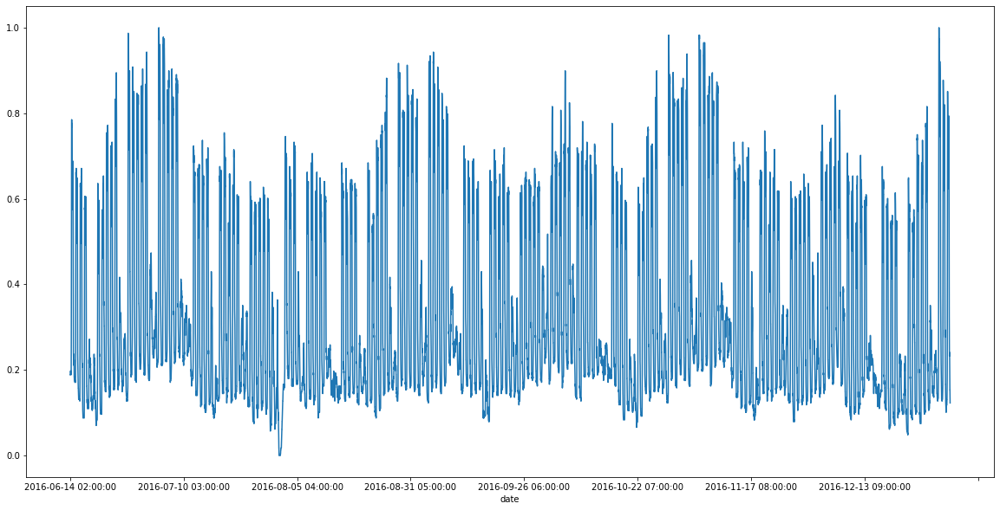

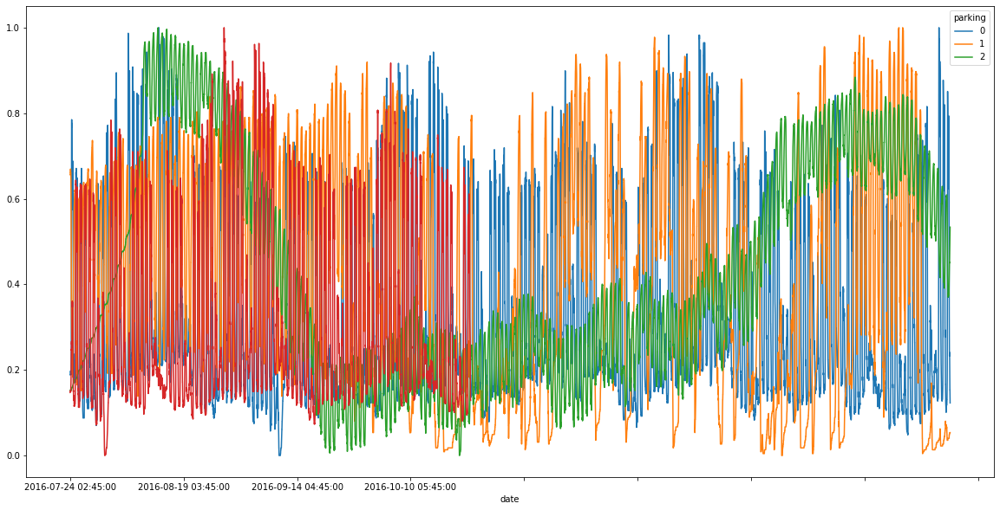

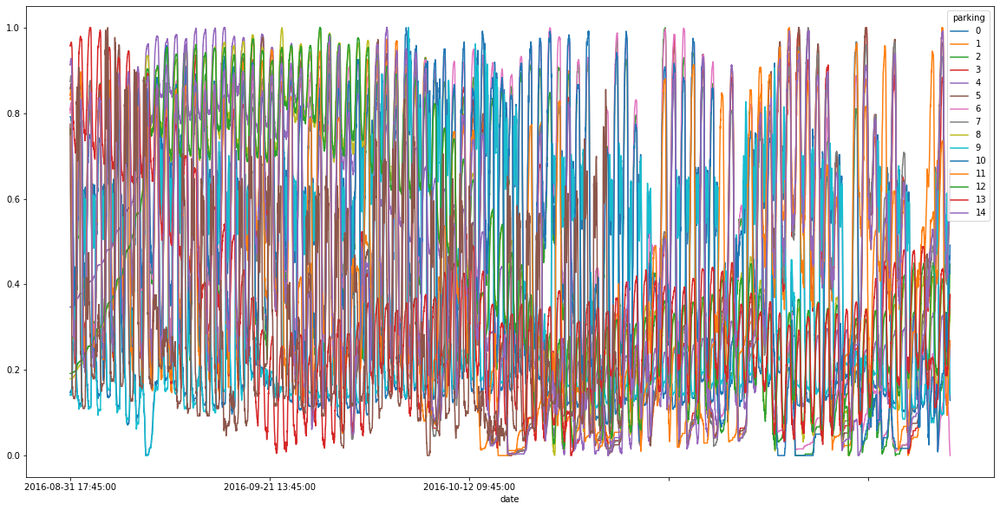

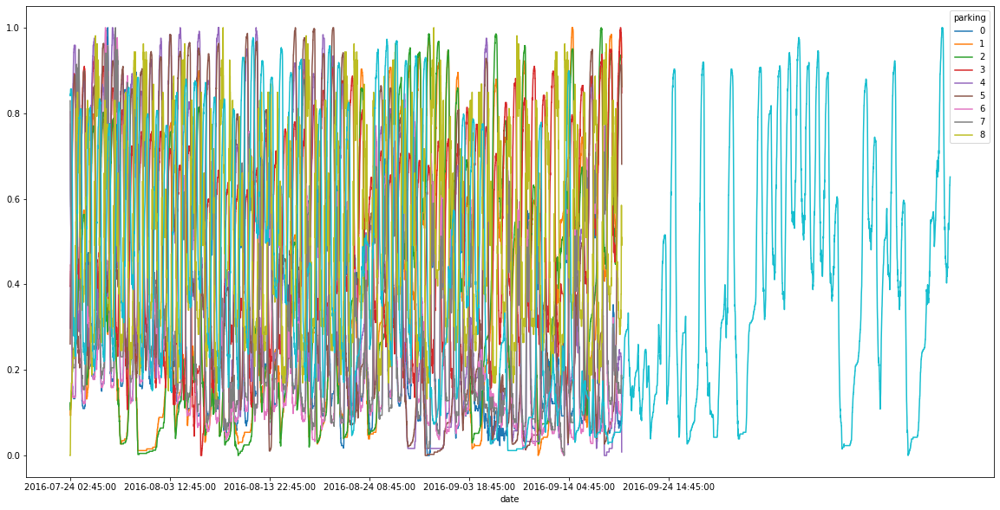

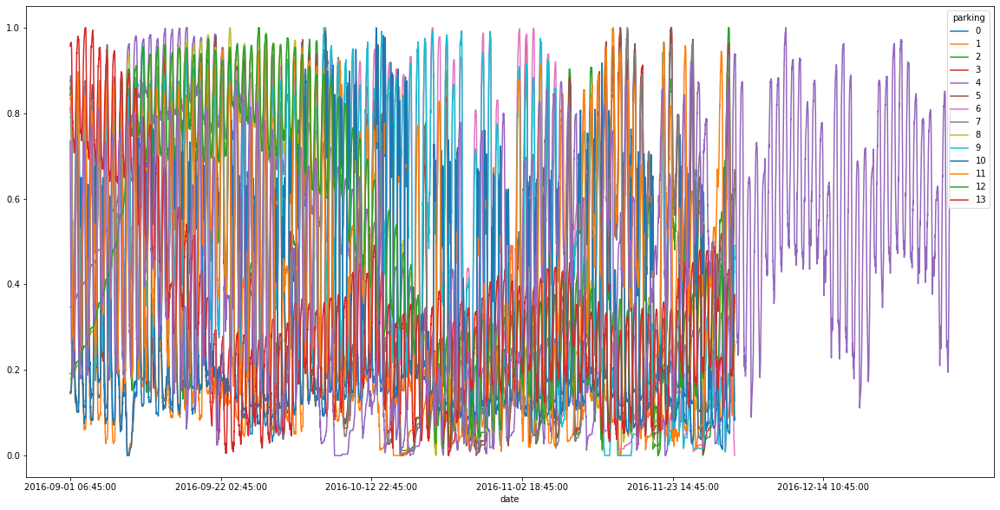

...

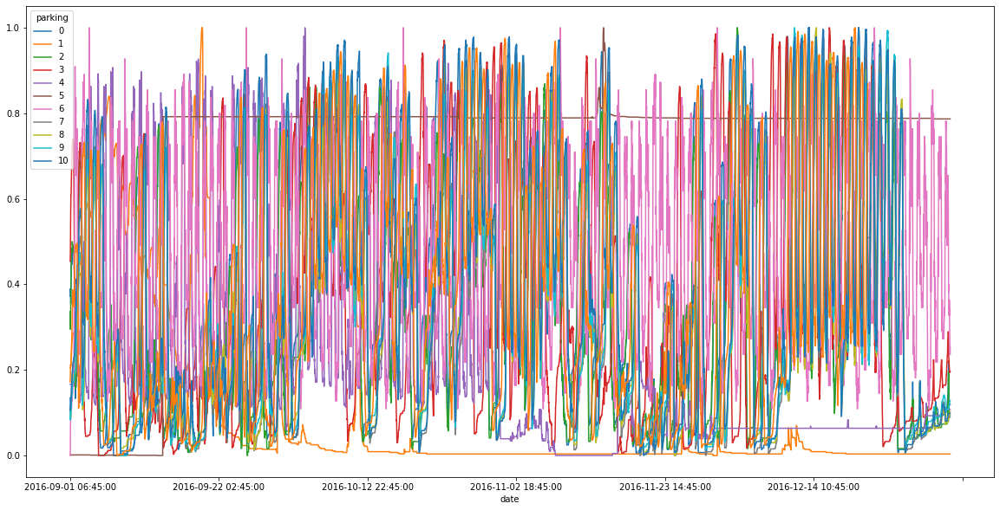

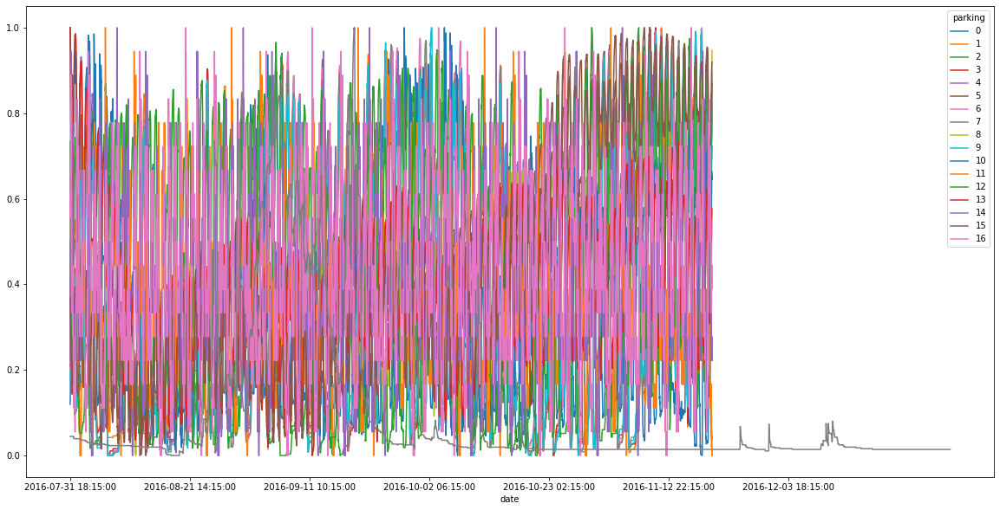

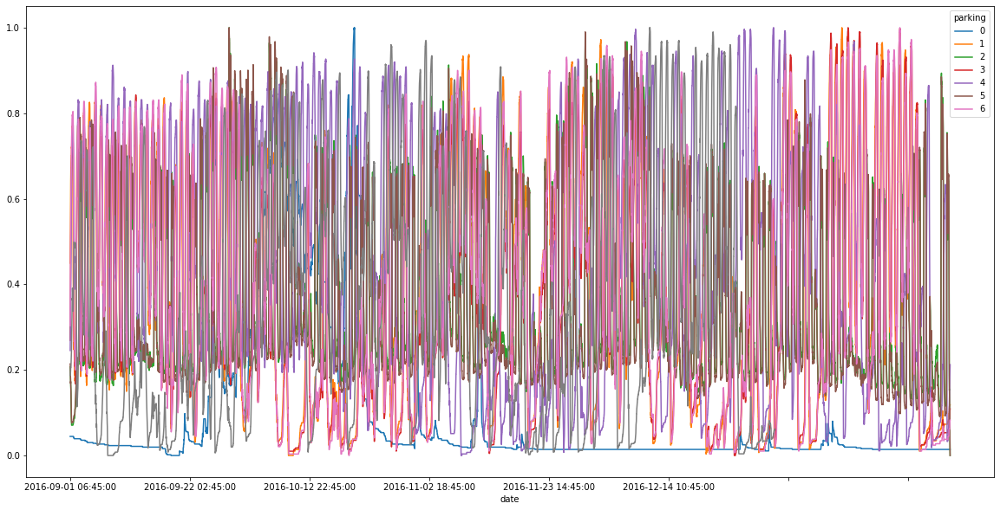

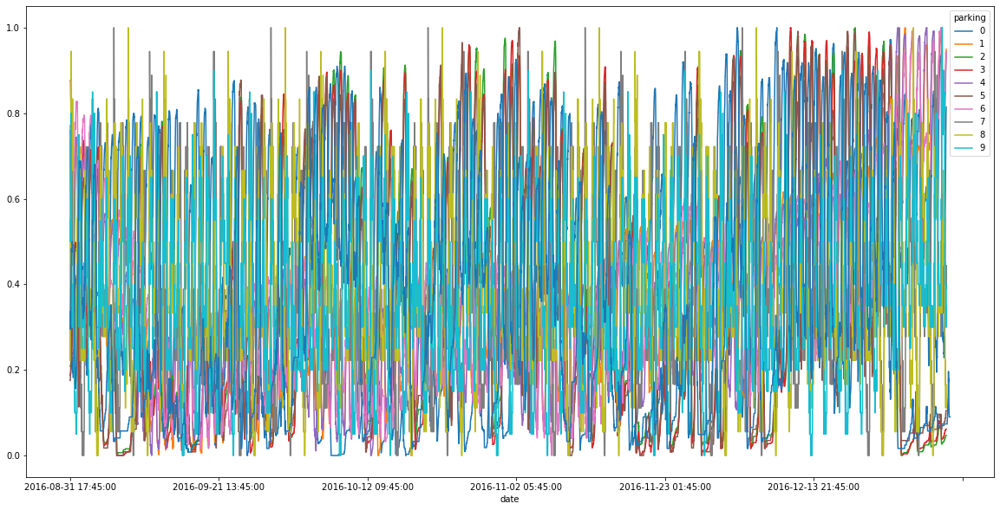

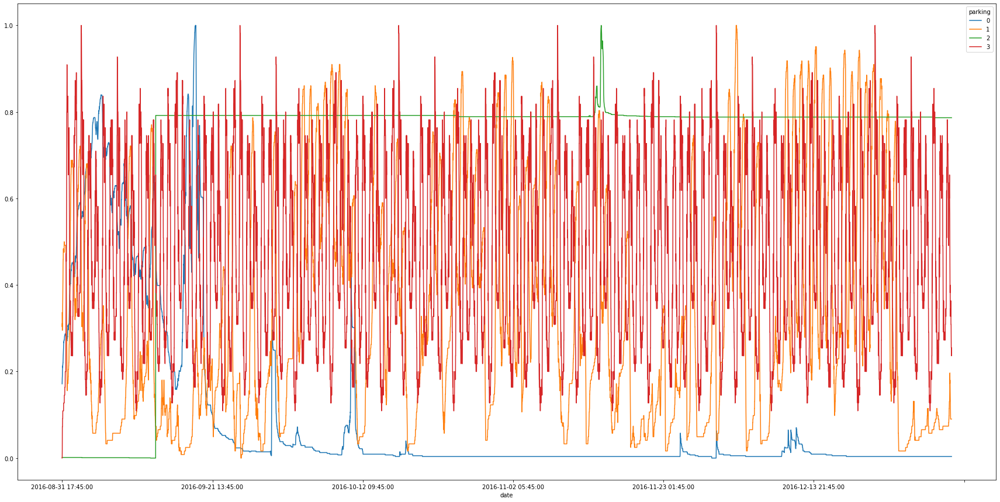

In [1]:
# data pattern search 
import train

train.search_data_pattern(epochs=100, graph_nodes_max_dis=0.5)